# Chapter 17: Recommending Books using LightGCN

In [36]:
import torch
# !pip install -q torch-scatter~=2.1.0 torch-sparse~=0.6.16 torch-cluster~=1.6.0 torch-spline-conv~=1.2.1 torch-geometric==2.2.0 -f https://data.pyg.org/whl/torch-{torch.__version__}.html

torch.manual_seed(0)
torch.cuda.manual_seed(0)
torch.cuda.manual_seed_all(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

## Exploring the Book-Crossing dataset

In [37]:
from io import BytesIO
from urllib.request import urlopen
from zipfile import ZipFile

import pandas as pd

""" url = 'http://www2.informatik.uni-freiburg.de/~cziegler/BX/BX-CSV-Dump.zip'
with urlopen(url) as zurl:
    with ZipFile(BytesIO(zurl.read())) as zfile:
        zfile.extractall('.') """

" url = 'http://www2.informatik.uni-freiburg.de/~cziegler/BX/BX-CSV-Dump.zip'\nwith urlopen(url) as zurl:\n    with ZipFile(BytesIO(zurl.read())) as zfile:\n        zfile.extractall('.') "

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

## Preprocessing the Book-Crossing dataset

In [39]:
import numpy as np
from sklearn.model_selection import train_test_split

import torch
import torch.nn.functional as F
from torch import nn, optim, Tensor

from torch_geometric.utils import structured_negative_sampling
from torch_geometric.nn.conv.gcn_conv import gcn_norm
from torch_geometric.nn import LGConv

In [40]:
df = pd.read_csv("tripadvisor_hoteles_cusco.csv")
df

,f1_hotel,f2_costo,f3_cliente,f4_titulo,f5_contenido,f6_calificacion,f7_fecHosped
0,Tocuyeros Boutique Hotel,PEN 677,julie w,Beautiful hotel,Lovely hotel in a great location. Just a short...,50,September 2023
1,Tocuyeros Boutique Hotel,PEN 677,steve w,great place and people,great place and people. we went from sept 16th...,50,September 2023
2,Tocuyeros Boutique Hotel,PEN 677,ShimonK2012,Excellent boutique hotel in prime location in ...,Our two night stay at Tocuyeros Boutique hotel...,50,September 2023
3,Tocuyeros Boutique Hotel,PEN 677,scott m,Amazing hotel!!,"Excellent accommodations, extremely friendly s...",50,August 2023
4,Tocuyeros Boutique Hotel,PEN 677,Genta M,Great time in Cusco,We had a great time in this hotel. It was clea...,50,August 2023
...,...,...,...,...,...,...,...
6095,Andean Dreams Hotel,PEN 85,pawqara,"Pricey, tiny, lame...",Pricey hotel that offers way less than what yo...,20,March 2016
6096,Andean Dreams Hotel,PEN 85,Nick P,Maybe a 1 star hotel.,"Hotel is old, smelly, toilet broken tried to f...",10,April 2015
6097,Andean Dreams Hotel,PEN 85,andresilvani,Not worth it,Yes it may be cheap but this place is disgusti...,10,April 2015
6098,Andean Dreams Hotel,PEN 85,GoLopez,Great service and location! Not bad at all...,"Stayed for 3 nights. First of all, lets be cle...",50,September 2014


In [41]:
df_filter = df[["f1_hotel", "f3_cliente", "f6_calificacion"]]
df_filter

,f1_hotel,f3_cliente,f6_calificacion
0,Tocuyeros Boutique Hotel,julie w,50
1,Tocuyeros Boutique Hotel,steve w,50
2,Tocuyeros Boutique Hotel,ShimonK2012,50
3,Tocuyeros Boutique Hotel,scott m,50
4,Tocuyeros Boutique Hotel,Genta M,50
...,...,...,...
6095,Andean Dreams Hotel,pawqara,20
6096,Andean Dreams Hotel,Nick P,10
6097,Andean Dreams Hotel,andresilvani,10
6098,Andean Dreams Hotel,GoLopez,50


In [42]:
df_filter["f6_calificacion"] = df_filter["f6_calificacion"] / 10
df_filter

/tmp/ipykernel_60212/975236935.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filter["f6_calificacion"] = df_filter["f6_calificacion"] / 10


,f1_hotel,f3_cliente,f6_calificacion
0,Tocuyeros Boutique Hotel,julie w,5.0
1,Tocuyeros Boutique Hotel,steve w,5.0
2,Tocuyeros Boutique Hotel,ShimonK2012,5.0
3,Tocuyeros Boutique Hotel,scott m,5.0
4,Tocuyeros Boutique Hotel,Genta M,5.0
...,...,...,...
6095,Andean Dreams Hotel,pawqara,2.0
6096,Andean Dreams Hotel,Nick P,1.0
6097,Andean Dreams Hotel,andresilvani,1.0
6098,Andean Dreams Hotel,GoLopez,5.0


In [43]:
df_filter_edge = df_filter[df_filter["f6_calificacion"] > 0]
df_filter_edge.columns = ["User-ID", "ISBN", "Book-Rating"]
# df_filter_edge.columns = ["ISBN", "User-ID", "Book-Rating"]

# column_to_move = df_filter_edge.pop("User-ID")
# df_filter_edge.insert(1, "User-ID", column_to_move)

df_filter_edge

,User-ID,ISBN,Book-Rating
0,Tocuyeros Boutique Hotel,julie w,5.0
1,Tocuyeros Boutique Hotel,steve w,5.0
2,Tocuyeros Boutique Hotel,ShimonK2012,5.0
3,Tocuyeros Boutique Hotel,scott m,5.0
4,Tocuyeros Boutique Hotel,Genta M,5.0
...,...,...,...
6095,Andean Dreams Hotel,pawqara,2.0
6096,Andean Dreams Hotel,Nick P,1.0
6097,Andean Dreams Hotel,andresilvani,1.0
6098,Andean Dreams Hotel,GoLopez,5.0


In [44]:
df = df_filter_edge.copy()
df

,User-ID,ISBN,Book-Rating
0,Tocuyeros Boutique Hotel,julie w,5.0
1,Tocuyeros Boutique Hotel,steve w,5.0
2,Tocuyeros Boutique Hotel,ShimonK2012,5.0
3,Tocuyeros Boutique Hotel,scott m,5.0
4,Tocuyeros Boutique Hotel,Genta M,5.0
...,...,...,...
6095,Andean Dreams Hotel,pawqara,2.0
6096,Andean Dreams Hotel,Nick P,1.0
6097,Andean Dreams Hotel,andresilvani,1.0
6098,Andean Dreams Hotel,GoLopez,5.0


In [45]:
df.to_csv("hotel_.csv", index=False)

In [46]:
print(df['User-ID'].nunique())
print(df['ISBN'].nunique())

1091
5721


In [47]:
print(df['User-ID'].unique())

['Tocuyeros Boutique Hotel' 'Hostal La Joya Imperial'
 'Hospedaje Casa Sapantiana' ... 'Embassy Backpackers'
 'Campanario Inn Hostel' 'Andean Dreams Hotel']


/home/win7/miniconda3/envs/min_web/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/win7/miniconda3/envs/min_web/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/home/win7/miniconda3/envs/min_web/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='Book-Rating', ylabel='count'>

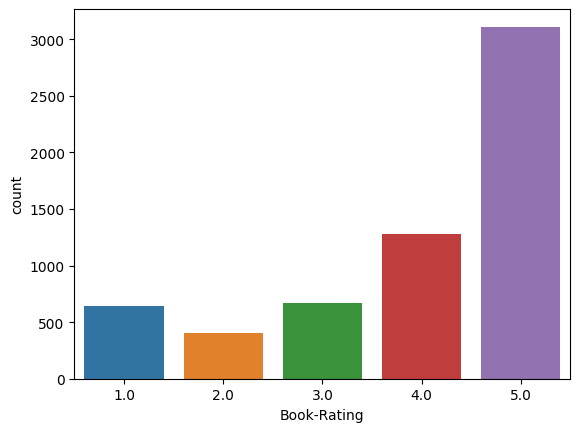

In [48]:
import matplotlib.pyplot as plt 
import seaborn as sns 

sns.countplot(x=df['Book-Rating']) 

Text(0, 0.5, 'Count')

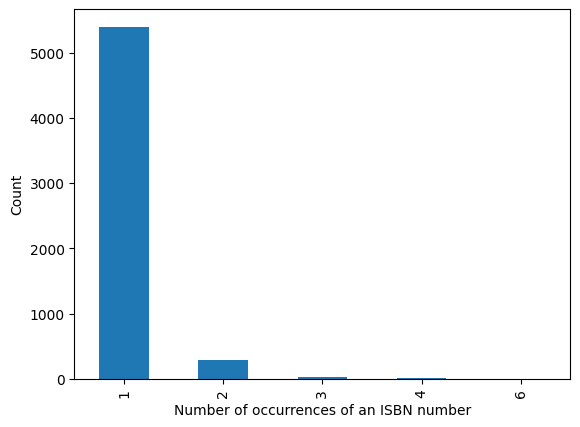

In [49]:
isbn_counts = df.groupby('ISBN').size()
count_occurrences = isbn_counts.value_counts()
count_occurrences[:15].plot(kind='bar')
plt.xlabel("Number of occurrences of an ISBN number")
plt.ylabel("Count")

Text(0, 0.5, 'Count')

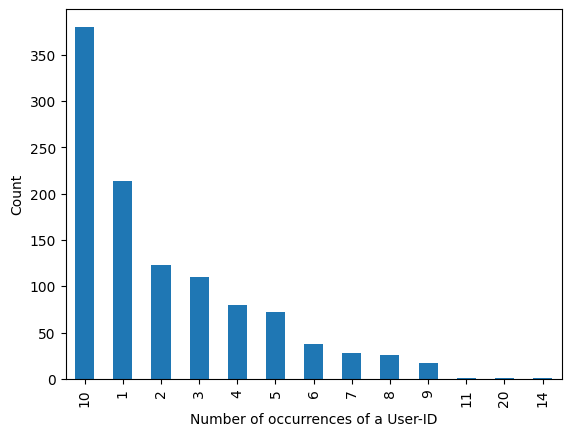

In [50]:
userid_counts = df.groupby('User-ID').size() 
count_occurrences = userid_counts.value_counts() 
count_occurrences[:15].plot(kind='bar')
plt.xlabel("Number of occurrences of a User-ID")
plt.ylabel("Count")

In [51]:
# Create mappings
user_mapping = {userid: i for i, userid in enumerate(df['User-ID'].unique())}
item_mapping = {isbn: i for i, isbn in enumerate(df['ISBN'].unique())}

# Count users and items
num_users = len(user_mapping)
num_items = len(item_mapping)
num_total = num_users + num_items

In [52]:
num_users, num_items, num_total

(1091, 5721, 6812)

In [53]:
# go
print(user_mapping)

{'Tocuyeros Boutique Hotel': 0, 'Hostal La Joya Imperial': 1, 'Hospedaje Casa Sapantiana': 2, 'Andean South Inn': 3, 'Okidoki Cusco Hostal': 4, 'Selina Cusco Saphi': 5, 'San Francisco Plaza Hotel': 6, 'Casa Tunki': 7, 'Cooper Hotel Boutique': 8, 'El Virrey Boutique Hostal': 9, 'MOAF Cusco Boutique': 10, 'Hotel Sauna & Spa Paradis Cusco': 11, 'Casona de Santa Ana': 12, 'Emperador Plaza Hotel': 13, 'Magic Cusco': 14, 'Inti Tampu Cusco Hotel': 15, 'Anahuarque Hotel Boutique': 16, 'Hostal Huaynapata': 17, 'Hotel Balconcillo': 18, 'Polo Cusco Suites': 19, 'Waman Qorikancha': 20, 'Centenario Inn': 21, 'Cities Of The World - Hotel Cusco': 22, 'Kenamari Hotel Cusco': 23, 'Casa Cristobal': 24, 'San Agustin El Dorado': 25, 'Hotel Warari': 26, 'Samay Wasi Youth Hostels Cusco': 27, 'Plaza de Armas Cusco Hotel': 28, 'La Casona Real Hotel': 29, 'Hotel Royal Qosqo': 30, 'Hotel Taypikala Cusco': 31, 'Maytaq Wasin Boutique Hotel': 32, 'Hotel Ruinas': 33, 'Kurumi Hostel': 34, 'Casa Cavassa Hotel Boutiqu

In [54]:
# go
print(item_mapping)

{'julie w': 0, 'steve w': 1, 'ShimonK2012': 2, 'scott m': 3, 'Genta M': 4, 'Mel M': 5, 'claudia': 6, 'I P': 7, 'Xiomara L': 8, 'Steven M': 9, 'Ingrid M': 10, 'geb1968': 11, 'Diego Ch': 12, 'Suzie': 13, 'Derek E': 14, 'Neil R': 15, 'Robert B': 16, 'Alexa G': 17, 'Ritos M': 18, 'Spencer B': 19, 'Marco G': 20, 'Oskarproject': 21, 'Fatimah Alyas': 22, 'Jeremy L': 23, 'Jeffrey F': 24, 'MickHuerta': 25, 'nighttrain66Riyadh': 26, 'Ness': 27, 'Dominick Santariga': 28, 'kalyanihariharan': 29, 'Vivian Michellin': 30, 'Sreeram H': 31, 'Necter Benjamin': 32, 'Alain M': 33, 'Jessica W': 34, 'Thea B': 35, 'Laura E Vazquez': 36, 'Rasmus S': 37, 'Alison D': 38, 'stefan c': 39, 'ihawk': 40, 'A.m.f.': 41, 'Alienor M': 42, 'P Bailey': 43, 'Mamjensen': 44, 'gddo': 45, 'Katrina A': 46, 'stephanie Murray': 47, 'dettespeis@aol.com': 48, 'Janjust16': 49, 'Elliot Black': 50, 'Stephanie S': 51, 'MonaTerrones': 52, 'Cara B': 53, 'HelgaT': 54, 'Ben': 55, 'Rick C': 56, 'Kelly S.': 57, 'Aisling N': 58, 'Lorenzo d':

In [55]:
# Build the adjacency matrix based on user ratings
user_ids = torch.LongTensor([user_mapping[i] for i in df['User-ID']])
item_ids = torch.LongTensor([item_mapping[i] for i in df['ISBN']])
edge_index = torch.stack((user_ids, item_ids))
edge_index

tensor([[   0,    0,    0,  ..., 1090, 1090, 1090],
        [   0,    1,    2,  ..., 5718, 5719, 5720]])

In [56]:
print(edge_index.shape)
edge_index

torch.Size([2, 6100])


tensor([[   0,    0,    0,  ..., 1090, 1090, 1090],
        [   0,    1,    2,  ..., 5718, 5719, 5720]])

In [57]:
user_ids.shape, item_ids.shape

(torch.Size([6100]), torch.Size([6100]))

In [58]:
range(len(df))

range(0, 6100)

In [59]:
# Create training, validation, and test adjacency matrices
train_index, test_index = train_test_split(range(len(df)), test_size=0.2, random_state=0)
val_index, test_index = train_test_split(test_index, test_size=0.5, random_state=0)

train_edge_index = edge_index[:, train_index]
val_edge_index = edge_index[:, val_index]
test_edge_index = edge_index[:, test_index]

In [60]:
train_edge_index.shape[1] + val_edge_index.shape[1] + test_edge_index.shape[1]

6100

In [61]:
train_edge_index.shape[1], val_edge_index.shape[1], test_edge_index.shape[1]

(4880, 610, 610)

In [62]:
# go
print(train_edge_index.shape)
train_edge_index

torch.Size([2, 4880])


tensor([[ 313,  388,  364,  ...,  193,  317,  331],
        [2474, 3058, 2893,  ..., 1609, 2514, 2633]])

In [63]:
# go
print(val_edge_index.shape)
val_edge_index

torch.Size([2, 610])


tensor([[ 894,  146,  508,  ...,  367,  648,  125],
        [5125, 1261, 3882,  ..., 2913, 4509, 1062]])

In [64]:
# go
print(test_edge_index.shape)
test_edge_index

torch.Size([2, 610])


tensor([[ 196,   32,   56,  ...,  165,  916,  108],
        [1629,  280,  492,  ..., 1411, 5187,  933]])

In [65]:
def sample_mini_batch(edge_index):
    # Generate BATCH_SIZE random indices
    index = np.random.choice(range(edge_index.shape[1]), size=BATCH_SIZE)
    print("xxx", index, edge_index.shape[1])

    # Generate negative sample indices
    edge_index = structured_negative_sampling(edge_index)
    edge_index = torch.stack(edge_index, dim=0)

    user_index = edge_index[0, index]
    pos_item_index = edge_index[1, index]
    neg_item_index = edge_index[2, index]

    return user_index, pos_item_index, neg_item_index

## Implementing the LightGCN architecture


In [66]:
class LightGCN(nn.Module):
    def __init__(self, num_users, num_items, num_layers=4, dim_h=64):
        super().__init__()

        self.num_users = num_users
        self.num_items = num_items
        self.num_layers = num_layers
        self.emb_users = nn.Embedding(num_embeddings=self.num_users, embedding_dim=dim_h)
        self.emb_items = nn.Embedding(num_embeddings=self.num_items, embedding_dim=dim_h)

        self.convs = nn.ModuleList(LGConv() for _ in range(num_layers))

        nn.init.normal_(self.emb_users.weight, std=0.01)
        nn.init.normal_(self.emb_items.weight, std=0.01)

    def forward(self, edge_index):
        emb = torch.cat([self.emb_users.weight, self.emb_items.weight])
        embs = [emb]

        for conv in self.convs:
            emb = conv(x=emb, edge_index=edge_index)
            embs.append(emb)

        emb_final = 1/(self.num_layers+1) * torch.mean(torch.stack(embs, dim=1), dim=1)

        emb_users_final, emb_items_final = torch.split(emb_final, [self.num_users, self.num_items])

        return emb_users_final, self.emb_users.weight, emb_items_final, self.emb_items.weight

In [67]:
def bpr_loss(emb_users_final, emb_users, emb_pos_items_final, emb_pos_items, emb_neg_items_final, emb_neg_items):
    reg_loss = LAMBDA * (emb_users.norm().pow(2) +
                        emb_pos_items.norm().pow(2) +
                        emb_neg_items.norm().pow(2))

    pos_ratings = torch.mul(emb_users_final, emb_pos_items_final).sum(dim=-1)
    neg_ratings = torch.mul(emb_users_final, emb_neg_items_final).sum(dim=-1)

    bpr_loss = torch.mean(torch.nn.functional.softplus(pos_ratings - neg_ratings))
    # bpr_loss = torch.mean(torch.nn.functional.logsigmoid(pos_ratings - neg_ratings))

    return -bpr_loss + reg_loss

def get_user_items(edge_index):
    user_items = dict()
    for i in range(edge_index.shape[1]):
        user = edge_index[0][i].item()
        item = edge_index[1][i].item()
        if user not in user_items:
            user_items[user] = []
        user_items[user].append(item)
    return user_items

def compute_recall_at_k(items_ground_truth, items_predicted):
    num_correct_pred = np.sum(items_predicted, axis=1)
    num_total_pred = np.array([len(items_ground_truth[i]) for i in range(len(items_ground_truth))])

    recall = np.mean(num_correct_pred / num_total_pred)

    return recall

def compute_ndcg_at_k(items_ground_truth, items_predicted):
    test_matrix = np.zeros((len(items_predicted), K))

    for i, items in enumerate(items_ground_truth):
        length = min(len(items), K)
        test_matrix[i, :length] = 1

    max_r = test_matrix
    idcg = np.sum(max_r * 1. / np.log2(np.arange(2, K + 2)), axis=1)
    dcg = items_predicted * (1. / np.log2(np.arange(2, K + 2)))
    dcg = np.sum(dcg, axis=1)
    idcg[idcg == 0.] = 1.
    ndcg = dcg / idcg
    ndcg[np.isnan(ndcg)] = 0.

    return np.mean(ndcg)

# wrapper function to get evaluation metrics
def get_metrics(model, edge_index, exclude_edge_indices):

    ratings = torch.matmul(model.emb_users.weight, model.emb_items.weight.T)

    for exclude_edge_index in exclude_edge_indices:
        user_pos_items = get_user_items(exclude_edge_index)
        exclude_users = []
        exclude_items = []
        for user, items in user_pos_items.items():
            exclude_users.extend([user] * len(items))
            exclude_items.extend(items)
        ratings[exclude_users, exclude_items] = -1024

    # get the top k recommended items for each user
    _, top_K_items = torch.topk(ratings, k=K)

    # get all unique users in evaluated split
    users = edge_index[0].unique()

    test_user_pos_items = get_user_items(edge_index)

    # convert test user pos items dictionary into a list
    test_user_pos_items_list = [test_user_pos_items[user.item()] for user in users]

    # determine the correctness of topk predictions
    items_predicted = []
    for user in users:
        ground_truth_items = test_user_pos_items[user.item()]
        label = list(map(lambda x: x in ground_truth_items, top_K_items[user]))
        items_predicted.append(label)

    recall = compute_recall_at_k(test_user_pos_items_list, items_predicted)
    ndcg = compute_ndcg_at_k(test_user_pos_items_list, items_predicted)

    return recall, ndcg

# wrapper function to evaluate model
def test(model, edge_index, exclude_edge_indices):
    emb_users_final, emb_users, emb_items_final, emb_items = model.forward(edge_index)
    user_indices, pos_item_indices, neg_item_indices = structured_negative_sampling(edge_index, contains_neg_self_loops=False)

    emb_users_final, emb_users = emb_users_final[user_indices], emb_users[user_indices]

    emb_pos_items_final, emb_pos_items = emb_items_final[pos_item_indices], emb_items[pos_item_indices]
    emb_neg_items_final, emb_neg_items = emb_items_final[neg_item_indices], emb_items[neg_item_indices]

    loss = bpr_loss(emb_users_final, emb_users, emb_pos_items_final, emb_pos_items, emb_neg_items_final, emb_neg_items).item()

    recall, ndcg = get_metrics(model, edge_index, exclude_edge_indices)

    return loss, recall, ndcg

## Train LightGCN architecture

In [68]:
K = 2
LAMBDA = 1e-6
BATCH_SIZE = 2

In [69]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = LightGCN(num_users, num_items)
model = model.to(device)
edge_index = edge_index.to(device)
train_edge_index = train_edge_index.to(device)
val_edge_index = val_edge_index.to(device)

optimizer = optim.Adam(model.parameters(), lr=0.001)

In [70]:
%%time

n_batch = int(len(train_index)/BATCH_SIZE)
print(n_batch)

for epoch in range(31):
    model.train()

    for _ in range(n_batch):
        optimizer.zero_grad()

        emb_users_final, emb_users, emb_items_final, emb_items = model.forward(train_edge_index)
        
        user_indices, pos_item_indices, neg_item_indices = sample_mini_batch(train_edge_index)
        print(user_indices, pos_item_indices, neg_item_indices)

        emb_users_final, emb_users = emb_users_final[user_indices], emb_users[user_indices]
        print(1)
        emb_pos_items_final, emb_pos_items = emb_items_final[pos_item_indices], emb_items[pos_item_indices]
        print(2)
        emb_neg_items_final, emb_neg_items = emb_items_final[neg_item_indices], emb_items[neg_item_indices]
        print(3)    

        train_loss = bpr_loss(emb_users_final, emb_users, emb_pos_items_final, emb_pos_items, emb_neg_items_final, emb_neg_items)

        train_loss.backward()
        optimizer.step()

    if epoch % 5 == 0:
        model.eval()
        val_loss, recall, ndcg = test(model, val_edge_index, [train_edge_index])
        print(f"Epoch {epoch} | Train loss: {train_loss.item():.5f} | Val loss: {val_loss:.5f} | Val recall@{K}: {recall:.5f} | Val ndcg@{K}: {ndcg:.5f}")

2440
xxx [4020 4092] 4880
tensor([583, 965]) tensor([ 889, 5303]) tensor([3455, 2809])
1
2
3
xxx [2941 2695] 4880
tensor([354,  73]) tensor([2825,  645]) tensor([2958, 4807])
1
2
3
xxx [967 518] 4880
tensor([125, 297]) tensor([1068, 2369]) tensor([4359, 2455])
1
2
3
xxx [  76 3205] 4880
tensor([ 74, 466]) tensor([ 658, 3636]) tensor([5523, 4798])
1
2
3
xxx [4442 4104] 4880
tensor([875,  44]) tensor([5083,  397]) tensor([1239, 3868])
1
2
3
xxx [1404 1653] 4880
tensor([ 415, 1051]) tensor([3228, 5580]) tensor([1347, 5612])
1
2
3
xxx [1412 1332] 4880
tensor([826, 434]) tensor([4992, 3387]) tensor([5095, 4985])
1
2
3
xxx [ 673 1444] 4880
tensor([406,   7]) tensor([3169,   61]) tensor([835, 193])
1
2
3
xxx [4358 2828] 4880
tensor([164, 359]) tensor([1401, 2868]) tensor([3670, 5003])
1
2
3
xxx [1215 4011] 4880
tensor([462, 297]) tensor([3608, 2374]) tensor([5686, 5496])
1
2
3
xxx [4704 4878] 4880
tensor([225, 317]) tensor([1841, 2514]) tensor([3053, 3210])
1
2
3
xxx [4368 4694] 4880
tensor([

xxx [3065 4655] 4880
tensor([466, 360]) tensor([3639, 2884]) tensor([3339, 1821])
1
2
3
xxx [3941 4578] 4880
tensor([465,  25]) tensor([3630,  208]) tensor([4691,  480])
1
2
3
xxx [2068 3088] 4880
tensor([120, 138]) tensor([1026, 1183]) tensor([1052, 1226])
1
2
3
xxx [2457  655] 4880
tensor([482, 996]) tensor([3718, 5386]) tensor([5140,  284])
1
2
3
xxx [3765 2786] 4880
tensor([906, 574]) tensor([5151, 4203]) tensor([3447, 3888])
1
2
3
xxx [1850 1167] 4880
tensor([868, 709]) tensor([5064, 4695]) tensor([4167, 5105])
1
2
3
xxx [4165 1439] 4880
tensor([346, 546]) tensor([2764, 4077]) tensor([1867,  859])
1
2
3
xxx [1077 3930] 4880
tensor([495, 107]) tensor([3792,  931]) tensor([1151, 3039])
1
2
3
xxx [ 25 575] 4880
tensor([285, 378]) tensor([2289, 2974]) tensor([1092, 5421])
1
2
3
xxx [2081 4436] 4880
tensor([138, 221]) tensor([1186, 1816]) tensor([1842,  265])
1
2
3
xxx [1345  344] 4880
tensor([720,  93]) tensor([4720,  803]) tensor([ 777, 1210])
1
2
3
xxx [1971 4386] 4880
tensor([374, 

In [71]:
test_loss, test_recall, test_ndcg = test(model, test_edge_index.to(device), [train_edge_index, val_edge_index])

print(f"Test loss: {test_loss:.5f} | Test recall@{K}: {test_recall:.5f} | Test ndcg@{K}: {test_ndcg:.5f}")

Test loss: -0.20392 | Test recall@2: 0.00075 | Test ndcg@2: 0.00137


## Recommending books for a particular user

In [72]:
user_pos_items = get_user_items(edge_index)
user_pos_items

{0: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 1: [10, 11],
 2: [12],
 3: [13, 14, 15, 16, 17, 18, 19, 20, 21, 22],
 4: [23, 24, 25, 26, 27, 28, 29, 30, 31, 32],
 5: [33, 34, 35, 36, 37, 38, 39, 40, 41, 42],
 6: [43, 44, 45, 46, 47, 48, 49, 50, 51, 52],
 7: [53, 54, 55, 56, 57, 58, 59, 60, 61, 62],
 8: [63, 64, 65, 66, 67, 68, 69, 70, 71, 72],
 9: [73, 74, 75, 76, 77, 78, 79, 80, 81, 82],
 10: [83, 84, 85, 86, 87, 88, 89, 90, 91, 92],
 11: [93, 94, 95, 96, 97, 98, 99, 100],
 12: [101, 102, 103, 104, 105],
 13: [106, 107, 108, 109, 110, 111, 112, 113, 114, 115],
 14: [116, 117],
 15: [118, 119, 120, 121],
 16: [122, 123, 124, 125, 126, 127, 128, 129, 130, 131],
 17: [132, 133, 134, 135, 136, 137, 138, 139, 140, 141],
 18: [142, 143, 144, 145, 146, 147, 148, 149, 150, 151],
 19: [152, 153, 154, 155, 156, 157, 158, 159, 160, 161],
 20: [162, 163, 164, 165, 166, 167, 168, 169, 170, 171],
 21: [172, 173, 174, 175, 176, 177],
 22: [178, 179, 180, 181, 182, 183, 184, 51, 185, 186],
 23: [187, 188, 189,

In [73]:
df

,User-ID,ISBN,Book-Rating
0,Tocuyeros Boutique Hotel,julie w,5.0
1,Tocuyeros Boutique Hotel,steve w,5.0
2,Tocuyeros Boutique Hotel,ShimonK2012,5.0
3,Tocuyeros Boutique Hotel,scott m,5.0
4,Tocuyeros Boutique Hotel,Genta M,5.0
...,...,...,...
6095,Andean Dreams Hotel,pawqara,2.0
6096,Andean Dreams Hotel,Nick P,1.0
6097,Andean Dreams Hotel,andresilvani,1.0
6098,Andean Dreams Hotel,GoLopez,5.0


In [74]:
print(user_mapping)

{'Tocuyeros Boutique Hotel': 0, 'Hostal La Joya Imperial': 1, 'Hospedaje Casa Sapantiana': 2, 'Andean South Inn': 3, 'Okidoki Cusco Hostal': 4, 'Selina Cusco Saphi': 5, 'San Francisco Plaza Hotel': 6, 'Casa Tunki': 7, 'Cooper Hotel Boutique': 8, 'El Virrey Boutique Hostal': 9, 'MOAF Cusco Boutique': 10, 'Hotel Sauna & Spa Paradis Cusco': 11, 'Casona de Santa Ana': 12, 'Emperador Plaza Hotel': 13, 'Magic Cusco': 14, 'Inti Tampu Cusco Hotel': 15, 'Anahuarque Hotel Boutique': 16, 'Hostal Huaynapata': 17, 'Hotel Balconcillo': 18, 'Polo Cusco Suites': 19, 'Waman Qorikancha': 20, 'Centenario Inn': 21, 'Cities Of The World - Hotel Cusco': 22, 'Kenamari Hotel Cusco': 23, 'Casa Cristobal': 24, 'San Agustin El Dorado': 25, 'Hotel Warari': 26, 'Samay Wasi Youth Hostels Cusco': 27, 'Plaza de Armas Cusco Hotel': 28, 'La Casona Real Hotel': 29, 'Hotel Royal Qosqo': 30, 'Hotel Taypikala Cusco': 31, 'Maytaq Wasin Boutique Hotel': 32, 'Hotel Ruinas': 33, 'Kurumi Hostel': 34, 'Casa Cavassa Hotel Boutiqu

In [75]:
user_id = "Cusco Hotel"
num_recs = 10

user = user_mapping[user_id]
print(user)
emb_user = model.emb_users.weight[user]
ratings = model.emb_items.weight @ emb_user

values, indices = torch.topk(ratings, k=10)

ids = [index.cpu().item() for index in indices if index in user_pos_items[user]][:num_recs]
item_isbns = [list(item_mapping.keys())[list(item_mapping.values()).index(book)] for book in ids]

print(item_isbns)

print(f'Favorite books from user n°{user_id}:')
for i in range(len(item_isbns)):
    print(f'- {item_isbns[i]}')
    

ids = [index.cpu().item() for index in indices if index not in user_pos_items[user]][:num_recs]
item_isbns = [list(item_mapping.keys())[list(item_mapping.values()).index(book)] for book in ids]
# titles = [bookid_title[id] for id in item_isbns]
# authors = [bookid_author[id] for id in item_isbns]

print(f'\nRecommended books for user n°{user_id}')
""" for i in range(num_recs):
    print(f'- {titles[i]}, by {authors[i]}') """
print(item_isbns)

1008
[]
Favorite books from user n°Cusco Hotel:

Recommended books for user n°Cusco Hotel
['Ana S', 'Sar067', 'Robert H', 'Geri-Sue J', 'Lindsay L', 'abberobics', 'Emilsen H', 'KarlaM1', 'Emily G', 'Omar TerSamud']
